# CNN+SVM

In [1]:
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
exec('from __future__ import  print_function')
from keras.applications import VGG16
from keras.utils import to_categorical
from keras.preprocessing.image import ImageDataGenerator, load_img
from keras.preprocessing.image import ImageDataGenerator
from keras.preprocessing import image
import keras

Data Pre-Processing

In [3]:
img_size = 224
batch_size = 20

In [4]:
train = ImageDataGenerator(rotation_range=30,
                              width_shift_range=0.1,
                              rescale=1/255,
                              shear_range=0.2,
                              zoom_range=0.2,
                              height_shift_range=0.1,
                              horizontal_flip=True,
                              fill_mode= "nearest",
                              )
test = ImageDataGenerator(rotation_range=30,
                              width_shift_range=0.1,
                              rescale=1/255,
                              shear_range=0.2,
                              zoom_range=0.2,
                              height_shift_range=0.1,
                              horizontal_flip=True,
                              fill_mode= "nearest",
                              )

In [5]:
train_data = train.flow_from_directory('hafizTraffic1/train/', target_size=(img_size,img_size), batch_size =batch_size, class_mode='categorical', shuffle=False)
validation_data = test.flow_from_directory('hafizTraffic1/test/', target_size=(img_size,img_size), batch_size =batch_size, class_mode='categorical', shuffle=False)

Found 2400 images belonging to 3 classes.
Found 600 images belonging to 3 classes.


In [6]:
print(train_data.class_indices)
print(train_data.classes)
print(validation_data.class_indices)
print(validation_data.classes)

{'highdensity': 0, 'lowdensity': 1, 'moderatedensity': 2}
[0 0 0 ... 2 2 2]
{'highdensity': 0, 'lowdensity': 1, 'moderatedensity': 2}
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 2 2 2 2 2 2 2
 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 

Data Feature Extraction

In [7]:
trainNum = 2400
valNum = 600

In [8]:
train_features = np.zeros(shape=(trainNum, 7, 7, 512))
train_labels = np.zeros(shape=(trainNum,3))

In [2]:
vgg_conv = VGG16(weights='imagenet',
                  include_top=False,
                  input_shape=(224, 224, 3))

vgg_conv.summary()

Model: "vgg16"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         [(None, 224, 224, 3)]     0         
_________________________________________________________________
block1_conv1 (Conv2D)        (None, 224, 224, 64)      1792      
_________________________________________________________________
block1_conv2 (Conv2D)        (None, 224, 224, 64)      36928     
_________________________________________________________________
block1_pool (MaxPooling2D)   (None, 112, 112, 64)      0         
_________________________________________________________________
block2_conv1 (Conv2D)        (None, 112, 112, 128)     73856     
_________________________________________________________________
block2_conv2 (Conv2D)        (None, 112, 112, 128)     147584    
_________________________________________________________________
block2_pool (MaxPooling2D)   (None, 56, 56, 128)       0     

In [9]:

i = 0
for inputs_batch, labels_batch in train_data:
    features_batch = vgg_conv.predict(inputs_batch)
    train_features[i * batch_size : (i + 1) * batch_size] = features_batch
    train_labels[i * batch_size : (i + 1) * batch_size] = labels_batch
    i += 1
    if i * batch_size >= trainNum:
        break
         
# The extracted features from training dataset is saved and to be passed for model.fit()
train_features = np.reshape(train_features, (trainNum, 7 * 7 * 512))

In [10]:
train_d =[]
for labels in train_labels:  
    if labels[0] == 1 and labels[1] == 0 and labels[2] == 0:
        train_d.append(0)
    elif labels[0] == 0 and labels[1] == 1 and labels[2] == 0:
        train_d.append(1)
    elif labels[0] == 0 and labels[1] == 0 and labels[2] == 1:
        train_d.append(2)
    else:
        print("something wrong somewhere")

In [11]:
validation_features = np.zeros(shape=(valNum, 7, 7, 512))
validation_labels = np.zeros(shape=(valNum,3))

In [12]:
i = 0
for inputs_batch, labels_batch in validation_data:
    features_batch = vgg_conv.predict(inputs_batch)
    validation_features[i * batch_size : (i + 1) * batch_size] = features_batch
    validation_labels[i * batch_size : (i + 1) * batch_size] = labels_batch
    i += 1
    if i * batch_size >= valNum:
        break

# The extracted features from validation dataset is saved and to be passed for model.fit()
validation_features = np.reshape(validation_features, (valNum, 7 * 7 * 512))

In [13]:
y_val =[]
for labels in validation_labels:  
    if labels[0] == 1 and labels[1] == 0 and labels[2] == 0:
        y_val.append(0)
    elif labels[0] == 0 and labels[1] == 1 and labels[2] == 0:
        y_val.append(1)
    elif labels[0] == 0 and labels[1] == 0 and labels[2] == 1:
        y_val.append(2)
    else:
        print("something wrong somewhere")

In [14]:
import numpy

In [15]:
arr = numpy.array(y_val)

# SVM Classifier

In [16]:
#Build model
import sklearn
from sklearn.model_selection import train_test_split
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import KFold
from sklearn.svm import LinearSVC
from sklearn.svm import SVC

#X_train, X_test, y_train, y_test = train_test_split(svm_features.reshape(750,7*7*512), svm_labels, test_size=0.20)
#clf=SVC(C=1,kernel='poly',gamma='auto')
#clf.fit(X_train,y_train) 
#svm = LinearSVC(penalty='l2', loss='squared_hinge')
#clf = SVC(kernel='rbf',gamma=0.001,tol=0.001,cache_size=1000,probability=True)
#split_size = 10
#rbfkernel

modelSVM=SVC()
modelSVM.fit(train_features,train_d)


SVC()

In [17]:
print("Accuracy on training set: {:.3f}".format(modelSVM.score(train_features, train_d)))

Accuracy on training set: 0.837


# Overall Test Accuracy

In [18]:
from sklearn.metrics import classification_report, confusion_matrix

In [19]:
Y_pred = modelSVM.predict(validation_features)
y_pred = np.argmax(Y_pred, axis=0)


In [21]:
print("Accuracy on test set: {:.3f}" .format(modelSVM.score(validation_features, y_val)))

Accuracy on test set: 0.810


# Test Accuracy by Category

# Low-Traffic

In [32]:
#change dir based on category
test_dataset = test.flow_from_directory('hafizTraffic1/test_low', target_size=(img_size,img_size), batch_size =batch_size, class_mode='categorical', shuffle=True)

Found 200 images belonging to 1 classes.


In [33]:
nVal = 200

In [34]:
test_features = np.zeros(shape=(nVal, 7, 7, 512))
test_labels = np.zeros(shape=(nVal,1))

In [35]:
#if hightraffic, test label=0
#if lowtraffic, test label=1
#if moderatetraffic, test label=2
i = 0
for inputs_batch, labels_batch in test_dataset:
    features_batch = vgg_conv.predict(inputs_batch)
    test_features[i * batch_size : (i + 1) * batch_size] = features_batch
    test_labels[i * batch_size : (i + 1) * batch_size] = 1
    i += 1
    if i * batch_size >= nVal:
        break

# save the features extracted from the validation dataset to be passed to model.fit for training 
test_features = np.reshape(test_features, (nVal, 7 * 7 * 512))

In [36]:
print("Accuracy on test set: {:.3f}".format(modelSVM.score(test_features, test_labels[:,0])))

Accuracy on test set: 0.845


In [37]:
# Get the predictions from the model using the generator
predictions = modelSVM.predict(test_features)

In [38]:
#if hightraffic, ground_truth=0
#if lowtraffic, ground_truthl=1
#if moderatetraffic, ground_truth=2
# Get the filenames from the generator
f_names = test_dataset.filenames

# Get the ground truth from generator
ground_truth = 1

# Get the label to class mapping from the generator
label_index = validation_data.class_indices
 
# Getting the mapping from class index to class label
idx_label = dict((v,k) for k,v in label_index.items())

In [ ]:
# Show the errors
errors = np.where(predictions != ground_truth)[0]

Wrong Prediction For Low Traffic

Original label:lowdensity\img (2).PNG, Prediction :moderatedensity


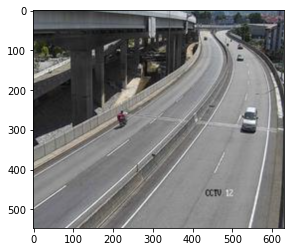

Original label:lowdensity\img (386).PNG, Prediction :highdensity


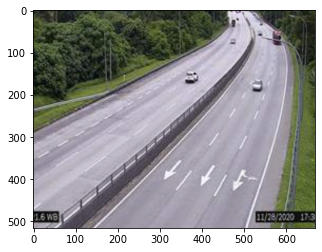

Original label:lowdensity\img (395).PNG, Prediction :moderatedensity


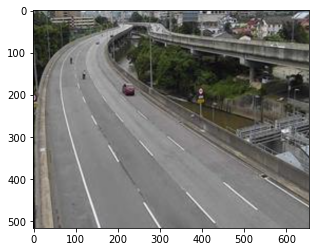

Original label:lowdensity\img (4).PNG, Prediction :moderatedensity


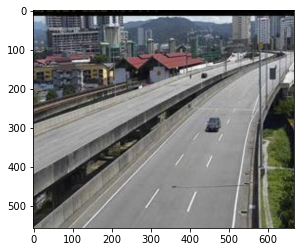

Original label:lowdensity\img (413).PNG, Prediction :moderatedensity


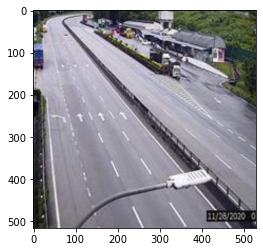

Original label:lowdensity\img (43).PNG, Prediction :moderatedensity


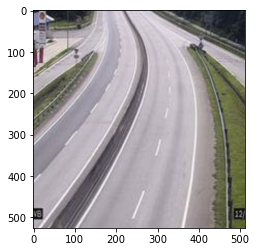

Original label:lowdensity\img (507).PNG, Prediction :highdensity


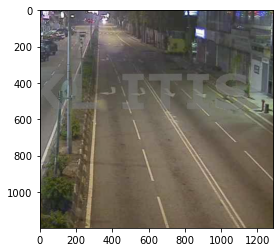

Original label:lowdensity\img (533).PNG, Prediction :moderatedensity


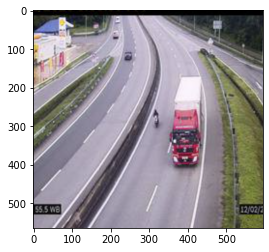

Original label:lowdensity\img (54).PNG, Prediction :moderatedensity


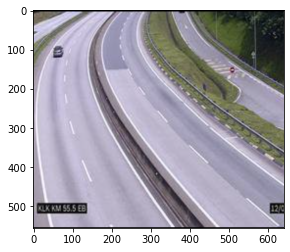

Original label:lowdensity\img (576).PNG, Prediction :moderatedensity


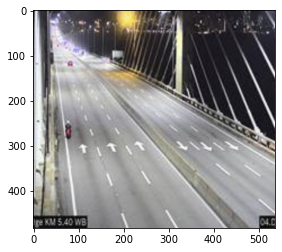

Original label:lowdensity\img (592).PNG, Prediction :moderatedensity


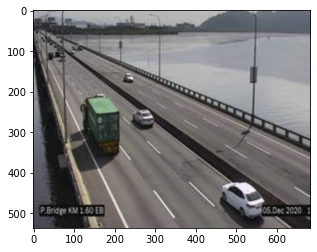

Original label:lowdensity\img (600).PNG, Prediction :moderatedensity


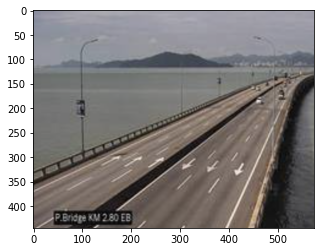

Original label:lowdensity\img (633).PNG, Prediction :moderatedensity


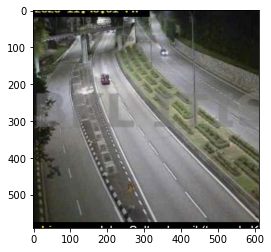

Original label:lowdensity\img (635).PNG, Prediction :moderatedensity


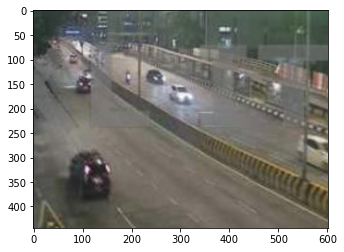

Original label:lowdensity\img (638).PNG, Prediction :moderatedensity


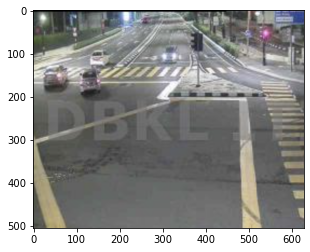

Original label:lowdensity\img (642).PNG, Prediction :moderatedensity


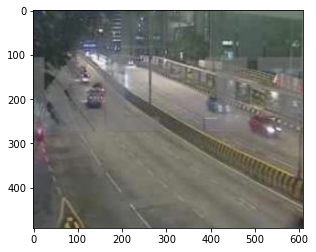

Original label:lowdensity\img (673).PNG, Prediction :moderatedensity


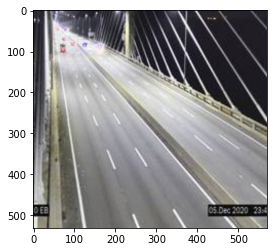

Original label:lowdensity\img (732).PNG, Prediction :moderatedensity


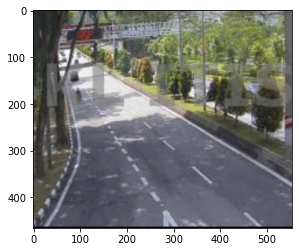

Original label:lowdensity\img (734).PNG, Prediction :moderatedensity


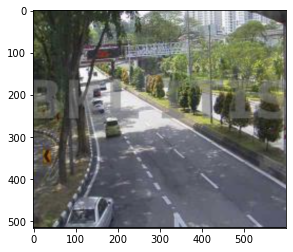

Original label:lowdensity\img (736).PNG, Prediction :moderatedensity


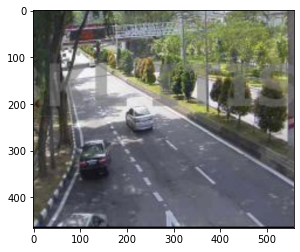

Original label:lowdensity\img (737).PNG, Prediction :moderatedensity


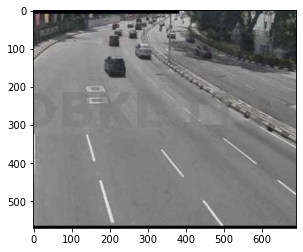

Original label:lowdensity\img (741).PNG, Prediction :highdensity


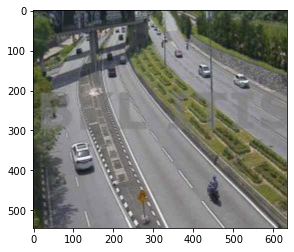

Original label:lowdensity\img (750).PNG, Prediction :moderatedensity


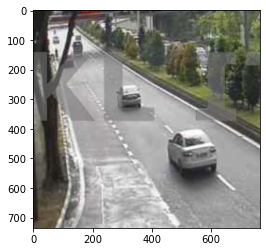

Original label:lowdensity\img (758).PNG, Prediction :moderatedensity


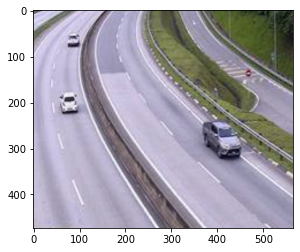

Original label:lowdensity\img (798).PNG, Prediction :moderatedensity


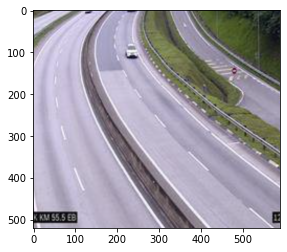

Original label:lowdensity\img (817).PNG, Prediction :moderatedensity


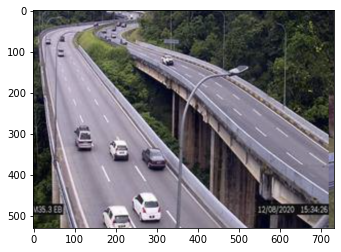

Original label:lowdensity\img (823).PNG, Prediction :moderatedensity


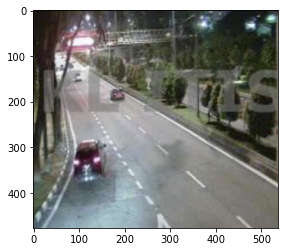

Original label:lowdensity\img (909).PNG, Prediction :moderatedensity


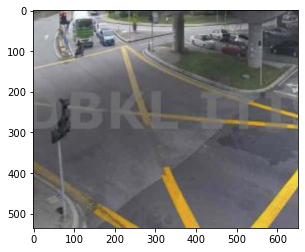

Original label:lowdensity\img (915).PNG, Prediction :moderatedensity


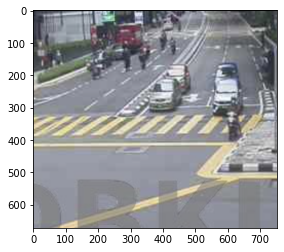

Original label:lowdensity\img (920).PNG, Prediction :moderatedensity


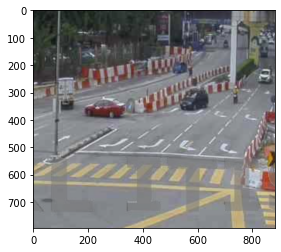

Original label:lowdensity\img (928).PNG, Prediction :moderatedensity


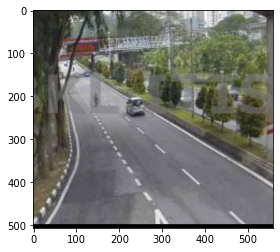

In [40]:
#change dir based on category
# Find the images that were predicted wrongly and who the images along with the predicted class

for i in range(len(errors)):
    pred_class = predictions[errors[i]]
    pred_label = idx_label[pred_class]
    
    print('Original label:{}, Prediction :{}'.format(
        f_names[errors[i]].split('/')[0],
        pred_label))
    
    original = image.load_img('{}/{}'.format('hafizTraffic1/test_low',f_names[errors[i]]))
    plt.imshow(original)
    plt.show()

# High-Traffic

In [41]:
#change dir based on category
test_dataset = test.flow_from_directory('hafizTraffic1/test_high', target_size=(img_size,img_size), batch_size =batch_size, class_mode='categorical', shuffle=False)

Found 200 images belonging to 1 classes.


In [42]:
nVal = 200

In [43]:
test_features = np.zeros(shape=(nVal, 7, 7, 512))
test_labels = np.zeros(shape=(nVal,1))

In [44]:
#if hightraffic, test label=0
#if lowtraffic, test label=1
#if moderatetraffic, test label=2
i = 0
for inputs_batch, labels_batch in test_dataset:
    features_batch = vgg_conv.predict(inputs_batch)
    test_features[i * batch_size : (i + 1) * batch_size] = features_batch
    test_labels[i * batch_size : (i + 1) * batch_size] = 0
    i += 1
    if i * batch_size >= nVal:
        break

# save the features extracted from the validation dataset to be passed to model.fit for training 
test_features = np.reshape(test_features, (nVal, 7 * 7 * 512))

In [45]:
print("Accuracy on test set: {:.3f}".format(modelSVM.score(test_features, test_labels[:,0])))

Accuracy on test set: 0.915


In [46]:
predictions = modelSVM.predict(test_features)

In [48]:
#if hightraffic, ground_truth=0
#if lowtraffic, ground_truthl=1
#if moderatetraffic, ground_truth=2
# Get the filenames from the generator
fnames = test_dataset.filenames

# Get the ground truth from generator
ground_truth = 0

# Get the label to class mapping from the generator
label2index = validation_data.class_indices
 
# Getting the mapping from class index to class label
idx2label = dict((v,k) for k,v in label2index.items())

In [ ]:
# Show the errors
errors = np.where(predictions != ground_truth)[0]

Wrong Prediction for High Traffic

Original label:highdensity\img (627).PNG, Prediction :lowdensity


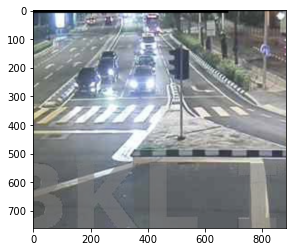

Original label:highdensity\img (631).PNG, Prediction :moderatedensity


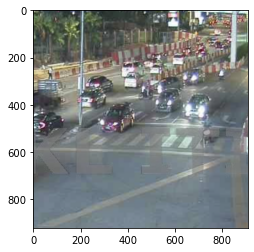

Original label:highdensity\img (691).PNG, Prediction :moderatedensity


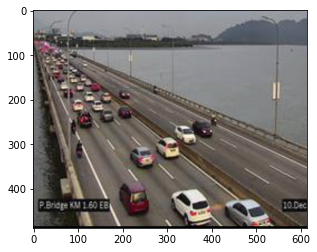

Original label:highdensity\img (695).PNG, Prediction :moderatedensity


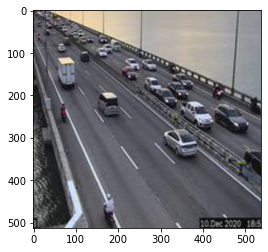

Original label:highdensity\img (697).PNG, Prediction :moderatedensity


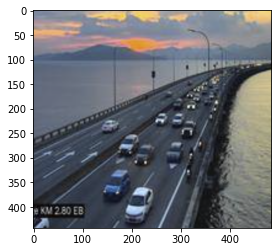

Original label:highdensity\img (764).PNG, Prediction :moderatedensity


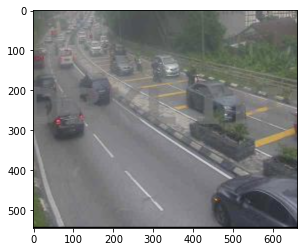

Original label:highdensity\img (773).PNG, Prediction :moderatedensity


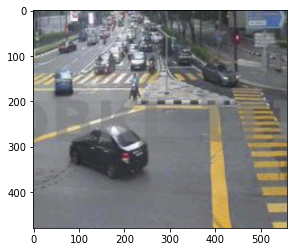

Original label:highdensity\img (783).PNG, Prediction :moderatedensity


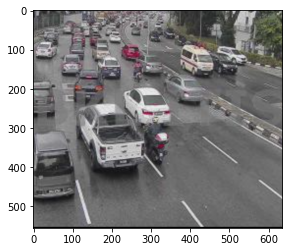

Original label:highdensity\img (784).PNG, Prediction :lowdensity


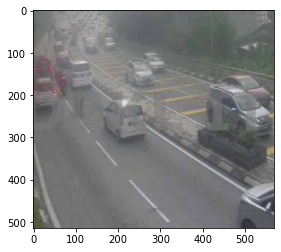

Original label:highdensity\img (795).PNG, Prediction :moderatedensity


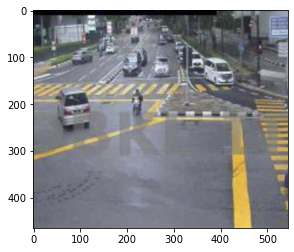

Original label:highdensity\img (801).PNG, Prediction :moderatedensity


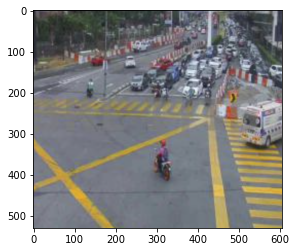

Original label:highdensity\img (803).PNG, Prediction :moderatedensity


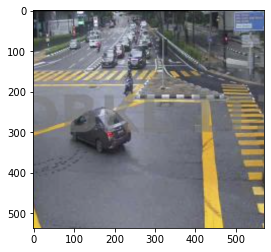

Original label:highdensity\img (812).PNG, Prediction :moderatedensity


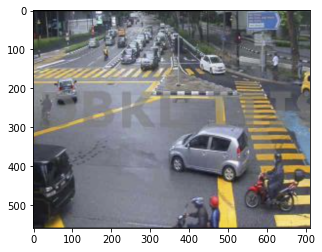

Original label:highdensity\img (815).PNG, Prediction :lowdensity


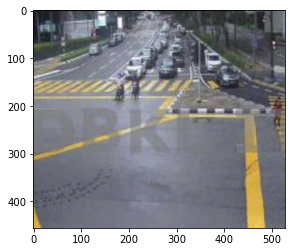

Original label:highdensity\img (887).PNG, Prediction :moderatedensity


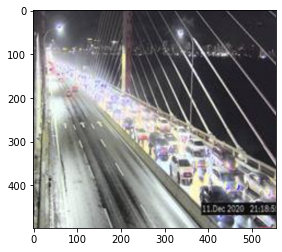

Original label:highdensity\img (949).PNG, Prediction :moderatedensity


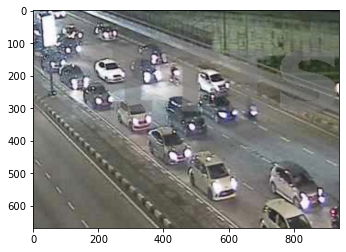

Original label:highdensity\img (958).PNG, Prediction :moderatedensity


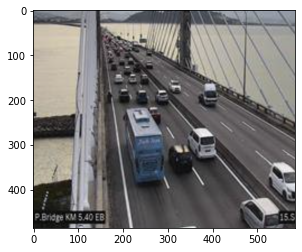

In [50]:
#change dir based on category
# Find the images that were predicted wrongly and who the images along with the predicted class

for i in range(len(errors)):
    pred_class = predictions[errors[i]]
    pred_label = idx2label[pred_class]
    
    print('Original label:{}, Prediction :{}'.format(
        fnames[errors[i]].split('/')[0],
        pred_label))
    
    original = image.load_img('{}/{}'.format('hafizTraffic1/test_high',fnames[errors[i]]))
    plt.imshow(original)
    plt.show()

# Moderate-Traffic

In [61]:
#change dir based on category
test_dataset = test.flow_from_directory('hafizTraffic1/test_moderate', target_size=(img_size,img_size), batch_size =batch_size, class_mode='categorical', shuffle=True)

Found 200 images belonging to 1 classes.


In [62]:
nVal = 200

In [63]:
test_features = np.zeros(shape=(nVal, 7, 7, 512))
test_labels = np.zeros(shape=(nVal,1))

In [64]:
#if hightraffic, test label=0
#if lowtraffic, test label=1
#if moderatetraffic, test label=2
i = 0
for inputs_batch, labels_batch in test_dataset:
    features_batch = vgg_conv.predict(inputs_batch)
    test_features[i * batch_size : (i + 1) * batch_size] = features_batch
    test_labels[i * batch_size : (i + 1) * batch_size] = 2
    i += 1
    if i * batch_size >= nVal:
        break

# save the features extracted from the validation dataset to be passed to model.fit for training 
test_features = np.reshape(test_features, (nVal, 7 * 7 * 512))

In [65]:
print("Accuracy on test set: {:.3f}".format(modelSVM.score(test_features, test_labels[:,0])))

Accuracy on test set: 0.705


In [66]:
predictions = modelSVM.predict(test_features)

In [68]:
#if hightraffic, ground_truth=0
#if lowtraffic, ground_truthl=1
#if moderatetraffic, ground_truth=2
# Get the filenames from the generator
fnames = test_dataset.filenames

# Get the ground truth from generator
ground_truth = 2

# Get the label to class mapping from the generator
label2index = validation_data.class_indices
 
# Getting the mapping from class index to class label
idx2label = dict((v,k) for k,v in label2index.items())

In [ ]:
# Show the errors
errors = np.where(predictions != ground_truth)[0]

Original label:moderatedensity\img (1034).PNG, Prediction :highdensity


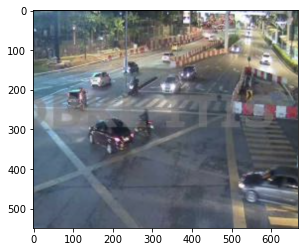

Original label:moderatedensity\img (1035).PNG, Prediction :lowdensity


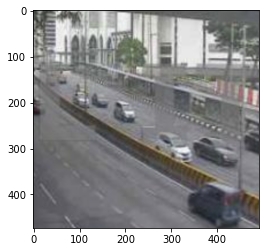

Original label:moderatedensity\img (1038).PNG, Prediction :lowdensity


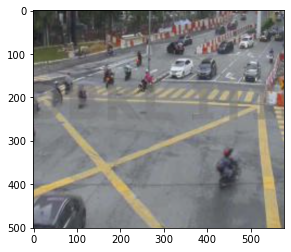

Original label:moderatedensity\img (371).PNG, Prediction :lowdensity


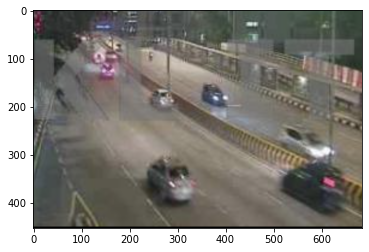

Original label:moderatedensity\img (455).PNG, Prediction :highdensity


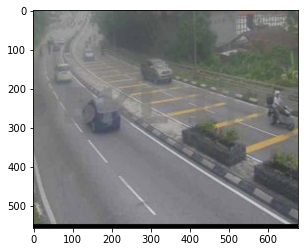

Original label:moderatedensity\img (462).PNG, Prediction :highdensity


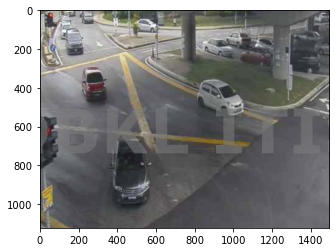

Original label:moderatedensity\img (470).PNG, Prediction :lowdensity


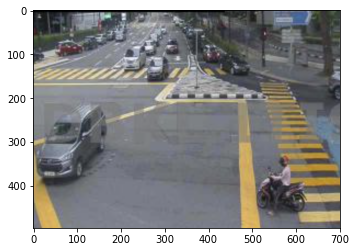

Original label:moderatedensity\img (476).PNG, Prediction :lowdensity


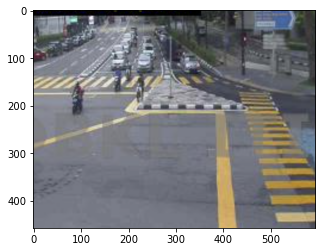

Original label:moderatedensity\img (479).PNG, Prediction :lowdensity


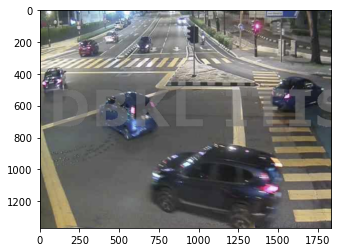

Original label:moderatedensity\img (487).PNG, Prediction :lowdensity


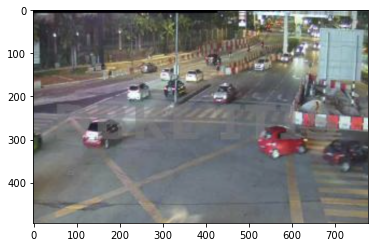

Original label:moderatedensity\img (491).PNG, Prediction :highdensity


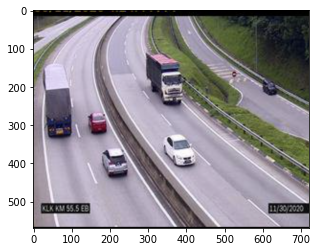

Original label:moderatedensity\img (496).PNG, Prediction :highdensity


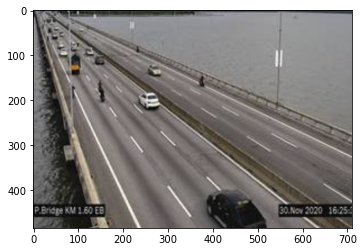

Original label:moderatedensity\img (498).PNG, Prediction :lowdensity


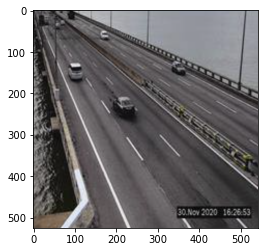

Original label:moderatedensity\img (499).PNG, Prediction :highdensity


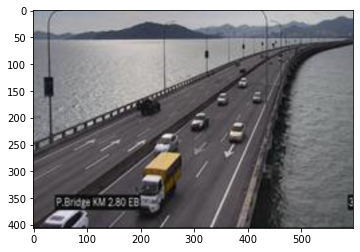

Original label:moderatedensity\img (505).PNG, Prediction :lowdensity


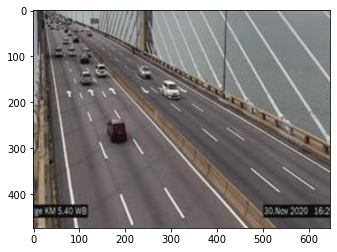

Original label:moderatedensity\img (507).PNG, Prediction :highdensity


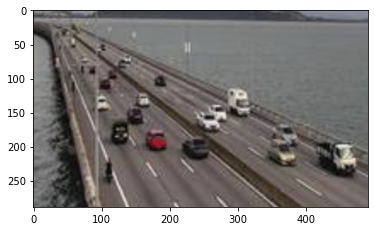

Original label:moderatedensity\img (554).PNG, Prediction :highdensity


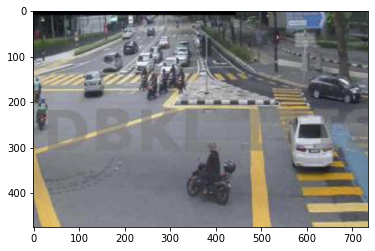

Original label:moderatedensity\img (596).PNG, Prediction :highdensity


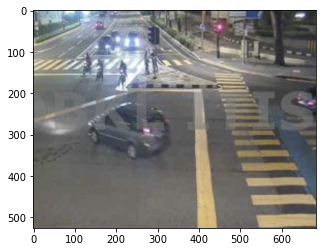

Original label:moderatedensity\img (606).PNG, Prediction :lowdensity


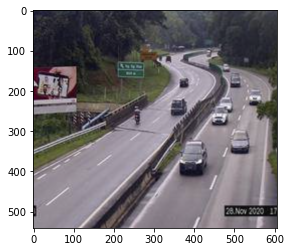

Original label:moderatedensity\img (622).PNG, Prediction :lowdensity


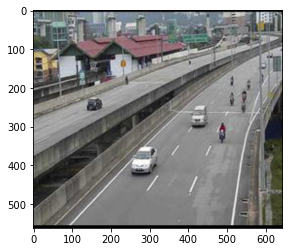

Original label:moderatedensity\img (625).PNG, Prediction :lowdensity


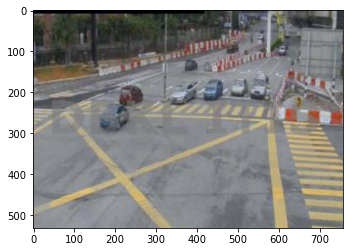

Original label:moderatedensity\img (647).PNG, Prediction :lowdensity


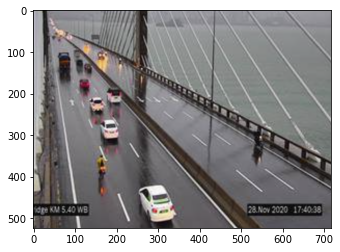

Original label:moderatedensity\img (651).PNG, Prediction :highdensity


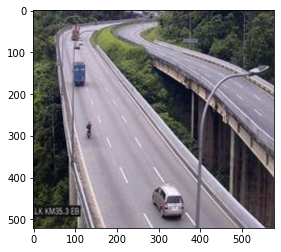

Original label:moderatedensity\img (662).PNG, Prediction :highdensity


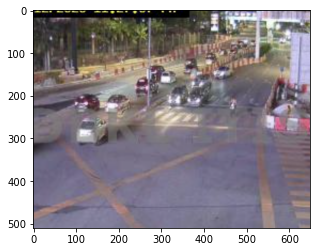

Original label:moderatedensity\img (67).PNG, Prediction :lowdensity


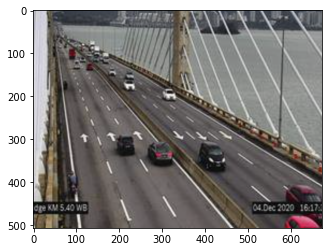

Original label:moderatedensity\img (675).PNG, Prediction :lowdensity


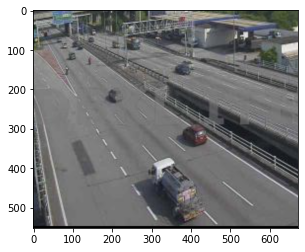

Original label:moderatedensity\img (744).PNG, Prediction :lowdensity


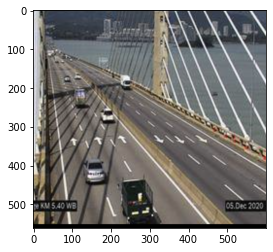

Original label:moderatedensity\img (747).PNG, Prediction :lowdensity


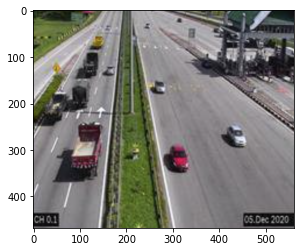

Original label:moderatedensity\img (780).PNG, Prediction :lowdensity


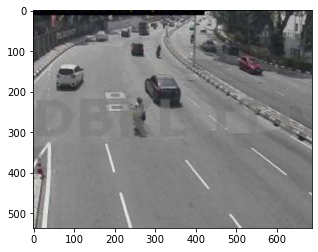

Original label:moderatedensity\img (782).PNG, Prediction :lowdensity


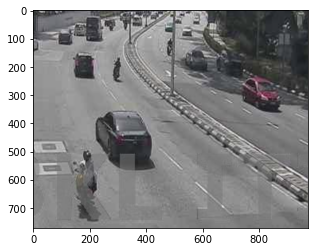

Original label:moderatedensity\img (849).PNG, Prediction :lowdensity


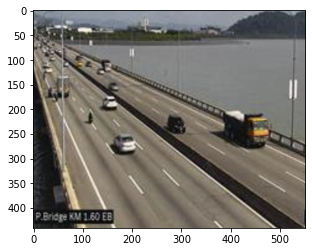

Original label:moderatedensity\img (850).PNG, Prediction :lowdensity


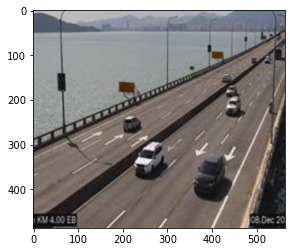

Original label:moderatedensity\img (854).PNG, Prediction :highdensity


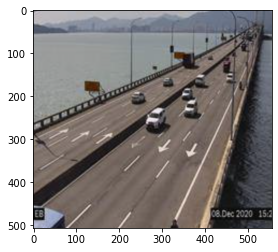

Original label:moderatedensity\img (860).PNG, Prediction :highdensity


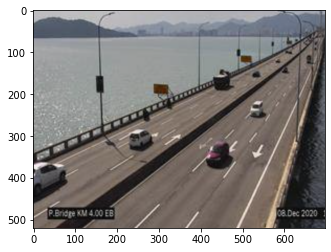

Original label:moderatedensity\img (861).PNG, Prediction :lowdensity


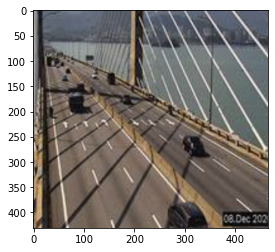

Original label:moderatedensity\img (881).PNG, Prediction :lowdensity


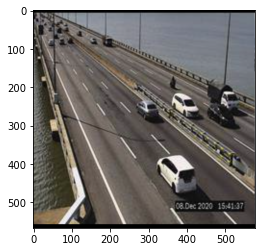

Original label:moderatedensity\img (883).PNG, Prediction :lowdensity


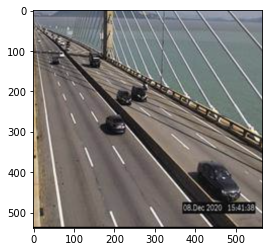

Original label:moderatedensity\img (885).PNG, Prediction :lowdensity


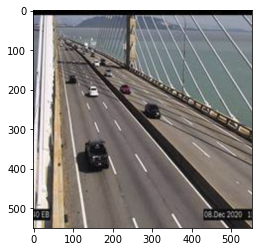

Original label:moderatedensity\img (887).PNG, Prediction :lowdensity


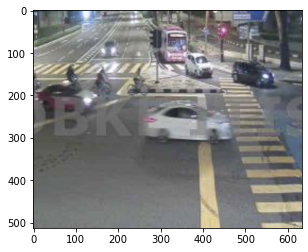

Original label:moderatedensity\img (888).PNG, Prediction :highdensity


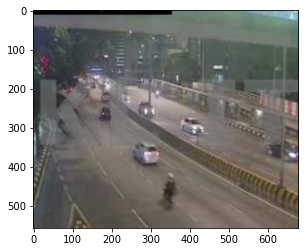

Original label:moderatedensity\img (892).PNG, Prediction :lowdensity


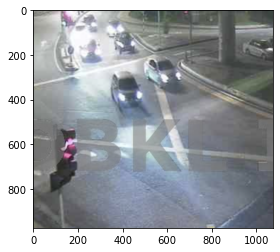

Original label:moderatedensity\img (893).PNG, Prediction :lowdensity


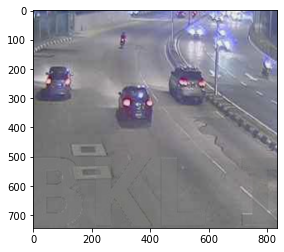

Original label:moderatedensity\img (900).PNG, Prediction :highdensity


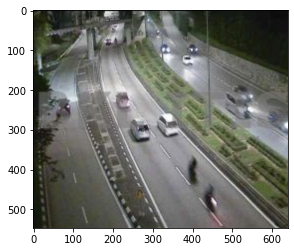

Original label:moderatedensity\img (908).PNG, Prediction :lowdensity


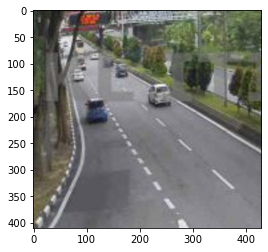

Original label:moderatedensity\img (909).PNG, Prediction :lowdensity


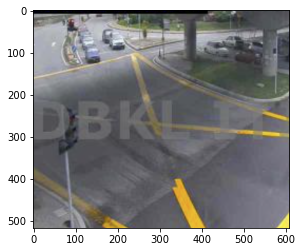

Original label:moderatedensity\img (910).PNG, Prediction :lowdensity


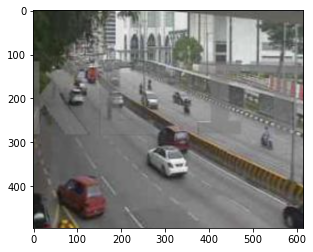

Original label:moderatedensity\img (925).PNG, Prediction :lowdensity


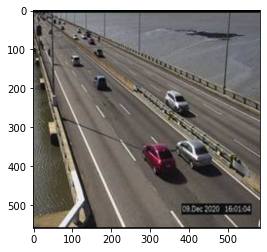

Original label:moderatedensity\img (929).PNG, Prediction :lowdensity


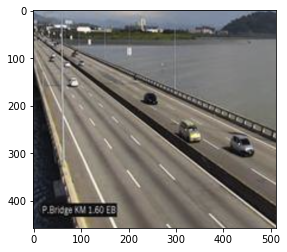

Original label:moderatedensity\img (933).PNG, Prediction :lowdensity


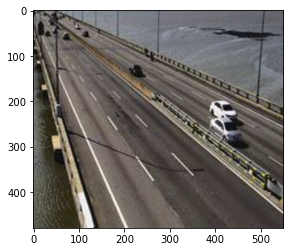

Original label:moderatedensity\img (934).PNG, Prediction :lowdensity


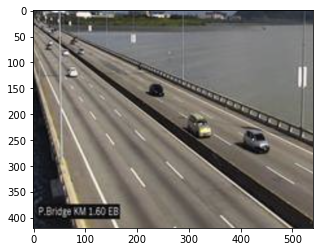

Original label:moderatedensity\img (935).PNG, Prediction :lowdensity


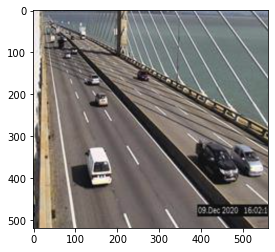

Original label:moderatedensity\img (940).PNG, Prediction :lowdensity


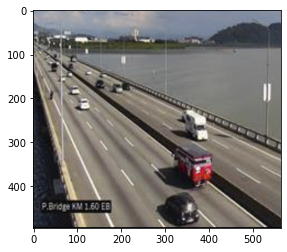

Original label:moderatedensity\img (947).PNG, Prediction :lowdensity


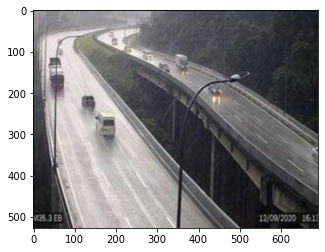

Original label:moderatedensity\img (953).PNG, Prediction :lowdensity


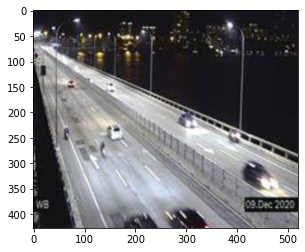

Original label:moderatedensity\img (956).PNG, Prediction :lowdensity


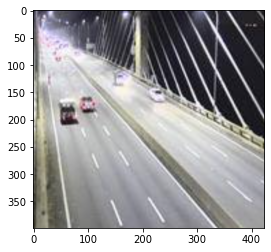

Original label:moderatedensity\img (959).PNG, Prediction :lowdensity


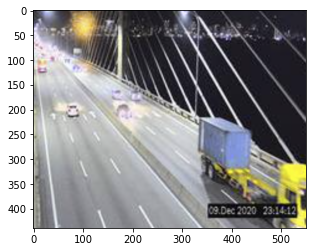

Original label:moderatedensity\img (960).PNG, Prediction :lowdensity


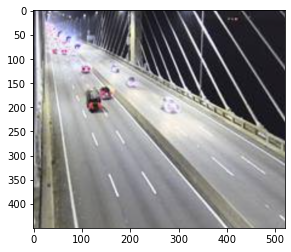

Original label:moderatedensity\img (975).PNG, Prediction :highdensity


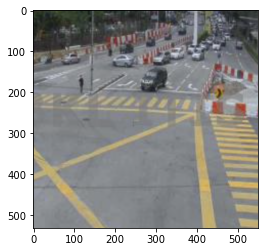

Original label:moderatedensity\img (976).PNG, Prediction :lowdensity


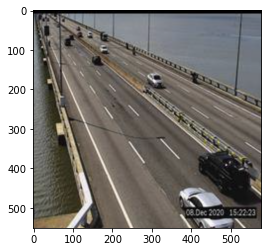

In [71]:
#change dir based on category
# Find the images that were predicted wrongly and who the images along with the predicted class

for i in range(len(errors)):
    pred_class = predictions[errors[i]]
    pred_label = idx2label[pred_class]
    
    print('Original label:{}, Prediction :{}'.format(
        fnames[errors[i]].split('/')[0],
        pred_label))
    
    original = image.load_img('{}/{}'.format('hafizTraffic1/test_moderate',fnames[errors[i]]))
    plt.imshow(original)
    plt.show()

In [20]:
print('Confusion Matrix')
print(confusion_matrix(arr, Y_pred))
print('Classification Report')
target_names = ['highdensity', 'lowdensity', 'moderatedensity']
print(classification_report(arr, Y_pred, target_names=target_names))

Confusion Matrix
[[185   2  13]
 [  4 166  30]
 [ 19  46 135]]
Classification Report
                 precision    recall  f1-score   support

    highdensity       0.89      0.93      0.91       200
     lowdensity       0.78      0.83      0.80       200
moderatedensity       0.76      0.68      0.71       200

       accuracy                           0.81       600
      macro avg       0.81      0.81      0.81       600
   weighted avg       0.81      0.81      0.81       600



In [73]:
import pickle

In [77]:
filename = "Cnn+svm_model.hdf5"
pickle.dump(modelSVM,open(filename,'wb'))

In [ ]:
loaded_model = pickle.load(open(filename, 'rb'))
result = loaded_model.score(test_features, test_labels[:,0])